In [1]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

### Data preparation

In [3]:
data = pd.read_csv('finalopdata_processed.csv').iloc[:-2,1:] # file name may be different
# 'Nbr_Of_Lane', 'Row_Width_Usual' have 78% NA, so dropped
data = data.drop(['Nbr_Of_Lane', 'Row_Width_Usual','speed_st','ped_age_st','incl_weather'], axis=1)
# drop gender with NA
data.dropna(subset=['ped_gender'], axis=0,inplace=True)
data.dropna(subset=['driver_gender'], axis=0,inplace=True)
#drop repeated variables
data = data.drop(['speed','pedage','vehmodelyr','driverage'],axis=1)

# remove rows with injury NaN
data = data.dropna(subset=['injury'], axis=0)

# rows with vehicle type all missing, so dropped
data = data.dropna(subset=['SUV'], axis=0)
data.reset_index(drop=True, inplace=True)
# data.head()

In [4]:
# check precentage of NA
percent_na = 100*data.apply(lambda x: x.isna().sum()/data.shape[0], axis=0)
pd.DataFrame(percent_na[percent_na>0], columns=['Percentage of NA'])

,Percentage of NA
road_place,0.004414
population,0.001471
Dr_Age,18.291624
Crash_Speed_Limit,9.813008
Veh_Mod_Year,14.417914
Latitude,30.332053
Longitude,30.332053


## NA filling

In [5]:
#fill one missing population with mode in street 'N HOUSTON ROSSLYN RD'
data.loc[data['population'].isna(),'population'] = data[data['Street_Name']=='N HOUSTON ROSSLYN RD'][['population','Street_Name']].mode()['population'][0]

# fill na's in road_place
# road_place:"ON_ROADWAY","OFF_ROADWAY","SHOULDER","MEDIAN","NOT_APPLICABLE"
data['road_place'].fillna(data['road_place'].mode()[0], inplace=True)

# fill na's in pedestrian gender and driver gender
data[['ped_gender','driver_gender']] =data[['ped_gender','driver_gender']].fillna('Unknown')

# fill na's in speed limit
# Mashrur fill NA with 0
# first fill na's wiht speed limit mode with the same street name, reduced the na's to 2.17%
mis_speed_street = data.loc[data['Crash_Speed_Limit'].isna(),'Street_Name']
for i in mis_speed_street:
    same_st = data.loc[(~data['Crash_Speed_Limit'].isna())&(data['Street_Name']==i),'Crash_Speed_Limit']
    if not same_st.empty:
        data.loc[(data['Crash_Speed_Limit'].isna()) & (data['Street_Name']==i),'Crash_Speed_Limit'] = same_st.mode()[0]
# no furthure information to fill remaining 1547 missing speed, so dropped
data = data.dropna(subset = ['Crash_Speed_Limit'], axis=0)

# fill na's with the age median of male, female and unknown (different from Mashrur)
# Mashrur fill NA with 'Other'
Dr_Age_median = data.groupby('driver_gender').Dr_Age.median()
data.loc[(data['Dr_Age'].isna())&(data['driver_gender']=='Female'),'Dr_Age'] =Dr_Age_median[0]
data.loc[(data['Dr_Age'].isna())&(data['driver_gender']=='MAle'),'Dr_Age']=Dr_Age_median[1]
data.loc[(data['Dr_Age'].isna())&(data['driver_gender']=='Unknown'),'Dr_Age'] =Dr_Age_median[2]

# discrete pedestreian age, driver age, vehicle model year
vehYear_bins = [1800,1995,2001,2006,2011,2016,2100]
vehYear_labels = ["prior_1995","1995_2000","2001_2005","2005_2010","2011_2015","After_2016"]
data['Veh_Mod_Year']=pd.cut(data['Veh_Mod_Year'],vehYear_bins,labels=vehYear_labels)
# fill na's with the mode of vehicle model year
# Mashrur fill NA with 'Unknown'
# data['Veh_Mod_Year'].fillna(data['Veh_Mod_Year'].mode()[0],inplace=True)
data['Veh_Mod_Year']=data['Veh_Mod_Year'].cat.add_categories('Unknown')
data['Veh_Mod_Year'].fillna('Unknown', inplace=True)

# age_bins = [-1,25,65,200]
# age_labes = ['less_24','middle_aged','old_65']
# data['Dr_Age']= pd.cut(data['Dr_Age'],age_bins,labels=age_labes)
# data['Ped_age']=pd.cut(data['Ped_age'],age_bins,labels=age_labes)

# check precentage of NA        
percent_na = 100*data.apply(lambda x: x.isna().sum()/data.shape[0], axis=0)
pd.DataFrame(percent_na[percent_na>0], columns=['Percentage of NA']) 

,Percentage of NA
Latitude,29.27783
Longitude,29.27783


## Model implementation

### One hot coding

In [6]:
# Not hotcoding for binary variables
data['intersection'] = data['intersection'].map({'N':0,'Y':1}) 
data['At_Intrsct_Fl'] = data['At_Intrsct_Fl'].map({'N':0,'Y':1})

In [7]:
binary_vars = ['Bus','car','motorcycle','Others','pickup','Public','SUV','truck','Van','hit_run','ped_alc',\
               'ped_drug','ped_intoxicated','dr_alc','dr_drug','dr_intoxicated','ped_dr_intoxicated','intersection','At_Intrsct_Fl']

numerical_vars = ['Crash_Speed_Limit','Ped_age','Dr_Age']
data[binary_vars] = data[binary_vars].astype(int)
data[binary_vars] = data[binary_vars].astype(int)
data['injury'] = data['injury'].astype(int)
data = data.reset_index(drop=True)

In [8]:
def hotcoding(df):
    df_oneHotCoded = pd.DataFrame(index= list(range(df.shape[0])))
    for i in df.columns:
        df_oneHotCoded = pd.concat([df_oneHotCoded,pd.get_dummies(df[i],prefix=i,prefix_sep='_').reset_index(drop=True)],axis=1)
    return df_oneHotCoded 

In [9]:
# prediction with all data
non_hotcoding_vars = ['Crash_ID','year','month','Latitude','Longitude','Street_Name'] + ['injury'] + numerical_vars+ binary_vars 
data2 = data.drop(columns=non_hotcoding_vars)
data2_dum = hotcoding(data2)
data_dum = pd.concat([data[['injury'] + numerical_vars+ binary_vars],data2_dum], axis=1)
# make the feature names compatible with lightGBM classifier
import re
data_dum = data_dum.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))
# data_dum.to_csv('all_variables_results/data_dum.csv')

In [234]:
data_dum.to_csv('final_data_dum.csv')

In [311]:
pd.DataFrame([100*data_dum[data_dum['injury']==i].shape[0]/data_dum.shape[0] for i in range(5)],columns=['Percentage'], 
             index=['class 0','class 1','class 2','class 3','class 4'])

,Percentage
class 0,6.949499
class 1,33.148856
class 2,36.037838
class 3,16.460132
class 4,7.403676


<ipython-input-221-0d9b0ef5919f>:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([0,5,10,15,20,25,30,35],fontsize=20)
<ipython-input-221-0d9b0ef5919f>:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([0,1,2,3,4],fontsize=20)


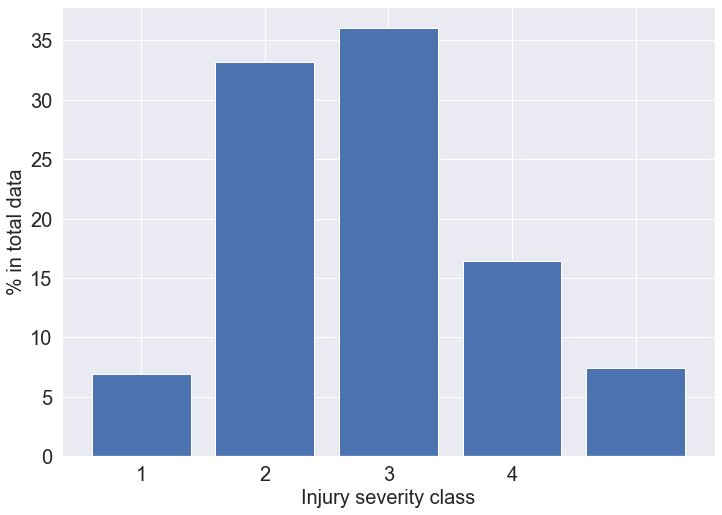

In [221]:
fig, ax = plt.subplots()
ax.bar([0,1,2,3,4],[100*data_dum[data_dum['injury']==i].shape[0]/data_dum.shape[0] for i in range(5)])
plt.ylabel('% in total data', fontsize=20)
plt.xlabel('Injury severity class', fontsize=20)
ax.set_yticklabels([0,5,10,15,20,25,30,35],fontsize=20)
ax.set_xticklabels([0,1,2,3,4],fontsize=20)
plt.savefig('all_variables_results2/label_distriubtion.jpg', dpi=300)

In [ ]:
# # predication with variables same as Mashrur did
# Mashrur_vars = ['pickup','SUV', 'truck', 'Van','Bus','motorcycle', 'Others','Veh_Mod_Year','Ped_age','ped_gender','Dr_Age','driver_gender',
# 'ped_dr_intoxicated','Crash_Speed_Limit','hit_run','intersection','road_class','road_place','road_alignment','traffic_control',
# 'population','time2','light']
# Mashrur_vars_binary = list(set(binary_vars)&set(Mashrur_vars))
# mydata= data[['injury']+Mashrur_vars]
# mydata_dum = pd.concat([mydata[['injury']+numerical_vars+Mashrur_vars_binary],hotcoding(mydata.drop(columns= ['injury']+numerical_vars+Mashrur_vars_binary))],axis=1)

# import re
# mydata_dum = mydata_dum.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

## Parameters fine tuning--BayesianOptimization 

In [11]:
from sklearn.model_selection import cross_val_score
from bayes_opt import BayesianOptimization

# modules should be in the same path with this code
from OrdinalClassifier import RandomForestOrdinalClassifier
from OrdinalClassifier import XGBOrdinalClassifier
from OrdinalClassifier import LGBMOrdinalClassifier
from OrdinalClassifier import xbartOrdinalClassifier

In [12]:

def RandomForestClassifierBayesianOptimization(X_dtrain, y_dtrain, X_dtest, y_dtest):
    def function(n_estimators, max_depth, min_samples_split, min_samples_leaf,max_features):
        return cross_val_score(
               RandomForestOrdinalClassifier(
                   n_estimators=int(max(n_estimators,0)),                                                               
                   max_depth=int(max(max_depth,1)),
                   min_samples_split=int(max(min_samples_split,2)),
                   min_samples_leaf = int(max(min_samples_leaf,1)),
                   max_features = int(max(max_features,1)),
                   random_state=42),  
               X=X_dtrain, 
               y=y_dtrain, 
               cv=4,
               scoring='accuracy').mean()

    parameters = {"n_estimators": (10, 150),
                  "max_depth": (10, 100),
                  "min_samples_split": (2,10),
                 'min_samples_leaf':(1,10),
                 'max_features':(1,10)}
    #optimize with BayesianOptimization
    bayes = BayesianOptimization(function, parameters)
    bayes.maximize(init_points=3, n_iter=7)
    optimal_params = bayes.max
    return optimal_params

In [13]:

def XGBClassifierBayesianOptimization(X_dtrain, y_dtrain, X_dtest, y_dtest):
    def function(learning_rate,max_depth, subsample,gamma, colsample_bytree, max_leaves,max_bin, min_child_weight,colsample_bylevel,
                reg_alpha,reg_lambda):
        val = cross_val_score(XGBOrdinalClassifier(learning_rate = max(learning_rate,0),
                                                   max_depth=int(round(max_depth)),
                                                   subsample=max(min(subsample, 1), 0),
                                                   gamma=max(gamma, 0),
                                                   colsample_bytree=max(min(colsample_bytree, 1), 0),
                                                   max_leaves=int(round(max_leaves)),
                                                   max_bin=int(round(max_bin)),
                                                   min_child_weight=min_child_weight,
                                                   colsample_bylevel=colsample_bylevel,
                                                   reg_alpha=max(reg_alpha, 0),
                                                   reg_lambda=max(reg_lambda, 0),
                                                   random_state=42),
                             X=X_dtrain, 
                             y=y_dtrain,
                             scoring='accuracy',
                             cv=4).mean()
        return val

    
    parameters = {'learning_rate':(0,0.5),
                  'max_depth': (0, 12), 
                  'gamma': (0, 1),
                  'subsample': (0.1, 0.9),
                  'max_leaves': (1000, 2000),
                  'colsample_bytree': (0.1, 0.9),
                  'reg_lambda': (0.1, 2),
                  'reg_alpha': (0.1, 2),
                  'max_bin':(180,500),
                  'colsample_bylevel':(0.1,0.9),
                  'min_child_weight': (3, 20)}
    #optimize with BayesianOptimization
    bayes = BayesianOptimization(function, parameters)
    bayes.maximize(init_points=3, n_iter=7)
    optimal_params = bayes.max
    return optimal_params

In [14]:


def lgb_optimization(X_dtrain, y_dtrain,X_dtest, y_dtest):
    def function(num_leaves, colsample_bytree, subsample, max_depth, reg_lambda, reg_alpha, min_split_gain, min_child_weight, 
                 subsample_freq):
        val = cross_val_score(LGBMOrdinalClassifier(num_leaves=int(round(num_leaves)),
                                                    colsample_bytree=max(min(colsample_bytree, 1), 0),
                                                    subsample=max(min(subsample, 1), 0),
                                                    max_depth=int(round(max_depth)),
                                                    reg_lambda=max(reg_lambda, 0),
                                                    reg_alpha=max(reg_alpha, 0),
                                                    min_split_gain=min_split_gain,
                                                    min_child_weight=min_child_weight,
                                                    subsample_freq=int(round(subsample_freq)),
                                                   random_state=42),
                             X=X_dtrain, 
                             y=y_dtrain,
                             scoring='accuracy',
                             cv=4).mean()
        return val
    
    parameters = {'num_leaves': (1000, 3000),
                  'colsample_bytree': (0.1, 0.9),
                  'subsample': (0.1, 0.9),
                  'max_depth': (-1, 12),
                  'reg_lambda': (0.1, 3),
                  'reg_alpha': (0.1, 3),
                  'subsample_freq':(1,20),
                  'min_split_gain': (0.1, 0.9),
                  'min_child_weight': (3, 30)}
    
    #optimize with BayesianOptimization
    bayes = BayesianOptimization(function, parameters)
    bayes.maximize(init_points=3, n_iter=7)
    optimal_params = bayes.max
    return optimal_params['params']

In [16]:
def xbartClassifierBayesianOptimization(X_dtrain, y_dtrain, X_dtest, y_dtest):
    def function(num_trees, tau, beta, num_cutpoints, n_min):
        ## may need to rewrite cross validation
        val = cross_val_score(xbartOrdinalClassifier(
                                                    num_trees=max(int(round(num_trees)),10),
                                                    tau=max(tau, 0),
                                                    beta=max(beta,0),
                                                    num_cutpoints=max(int(round(num_cutpoints)),0),
                                                    n_min=max(int(round(n_min)),0),
                                                    seed =42),
                             X=X_dtrain, 
                             y=y_dtrain,
                             scoring= 'accuracy',
                             cv=3).mean()
        return val
    
    parameters = {'num_trees': (10,500),
                  'tau': (0,5),
                  'beta': (0,5),
                  'num_cutpoints': (0,200),
                  'n_min': (0,100)}
        #optimize with BayesianOptimization
    bayes = BayesianOptimization(function, parameters)
    bayes.maximize(init_points=2, n_iter=4)
    optimal_params = bayes.max
    return optimal_params

## Model evaluation

In [224]:
# 10 times repeat to evaluate the model
from sklearn.metrics import roc_auc_score,recall_score,precision_score,accuracy_score,f1_score
import time
from sklearn.model_selection import train_test_split
from imblearn.metrics import geometric_mean_score
import copy

In [ ]:
################### Plot ROC curve on test dataset ########################################################################
'''code adapted from 
https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html#sphx-glr-auto-examples-model-selection-plot-roc-py'''
X_train, X_test, y_train, y_test = train_test_split(data_dum.drop(columns=['injury']),data_dum['injury'],test_size=0.2,random_state=42)
classes = list(range(5))

################# Parameter fine-tuning########################
rfc_params = RandomForestClassifierBayesianOptimization(X_train, y_train, X_test, y_test)['params']
# convert to integer
for i in ['n_estimators','max_depth','min_samples_split','min_samples_leaf','max_features']:
    rfc_params[i] = int(round(rfc_params[i]))
xgb_params = XGBClassifierBayesianOptimization(X_train, y_train, X_test, y_test)['params']
# convert to integer
for i in ['max_depth','max_leaves','max_bin']:
    xgb_params[i] = int(round(xgb_params[i]))
lgb_params = lgb_optimization(X_train, y_train, X_test, y_test)
# convert to integer
for i in ['num_leaves','max_depth','subsample_freq']:
    lgb_params[i] = int(round(lgb_params[i]))
    
rfc_model = RandomForestOrdinalClassifier(**rfc_params).fit(X_train,y_train)
rfc_predict_proba_test = rfc_model.predict_proba(X_test)
xgb_model = XGBOrdinalClassifier(**xgb_params).fit(X_train,y_train)
xgb_predict_proba_test = xgb_model.predict_proba(X_test)
lgb_model = LGBMOrdinalClassifier(**lgb_params).fit(X_train,y_train)
lgb_predict_proba_test = lgb_model.predict_proba(X_test)
xbart_model = xbartOrdinalClassifier().fit(X_train,y_train, X_train.shape[1]-len(numerical_vars))
xbart_predict_proba_test = xbart_model.predict_proba(X_test) 
 

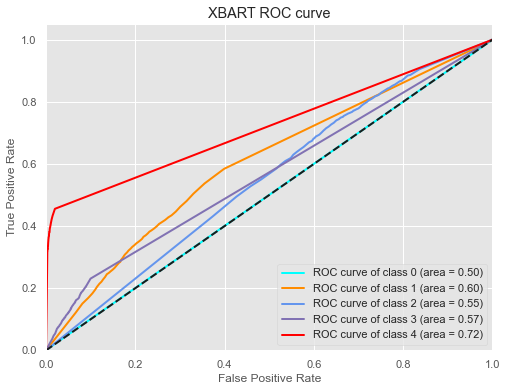

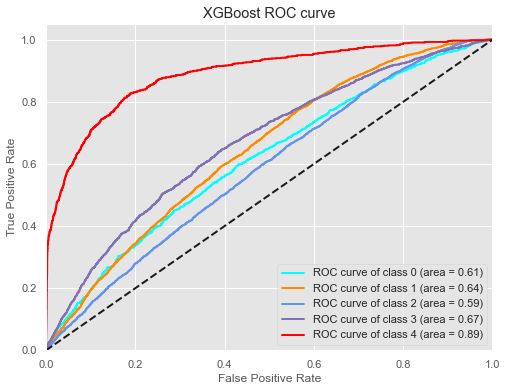

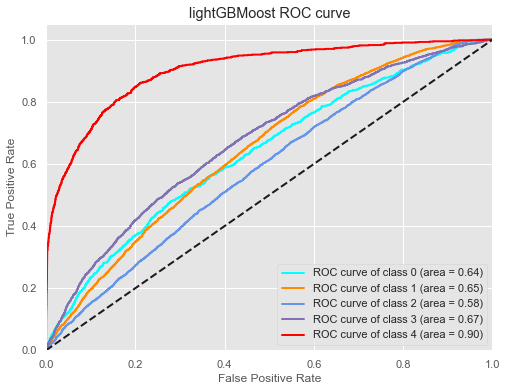

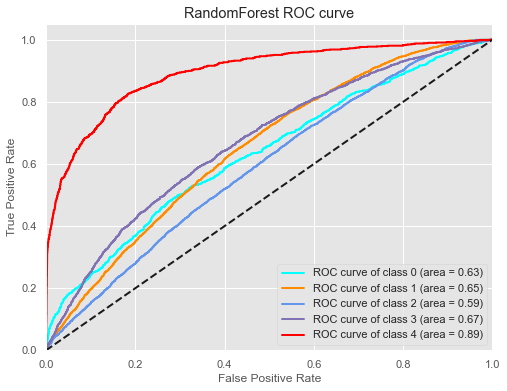

In [360]:
from sklearn.preprocessing import label_binarize 
from sklearn.metrics import roc_curve, auc
import itertools
y_binary_label = label_binarize(y_test, classes=classes) # injury label {0,1,2,3,4}
def roc_auc_computing(y_score):
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(len(classes)):
        fpr[i], tpr[i], _ = roc_curve(y_binary_label[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    return fpr, tpr, roc_auc
xbart_fpr, xbart_tpr, xbart_roc_auc = roc_auc_computing(xbart_predict_proba_test)
xgb_fpr, xgb_tpr, xgb_roc_auc = roc_auc_computing(xgb_predict_proba_test)
lgb_fpr, lgb_tpr, lgb_roc_auc = roc_auc_computing(lgb_predict_proba_test)
rfc_fpr, rfc_tpr, rfc_roc_auc = roc_auc_computing(rfc_predict_proba_test)

def roc_curve_plot(fpr,tpr,roc_auc,title):
    colors = itertools.cycle(['aqua', 'darkorange', 'cornflowerblue','m','red'])
    plt.figure(figsize=(8,6))
    for i, color in zip(range(len(classes)), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
            label='ROC curve of class {0} (area = {1:0.2f})'''.format(i, roc_auc[i]))
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(title)
    plt.legend(loc="lower right")
    plt.savefig('all_variables_results3_marginal_effect_with_probability/'+title+'.jpg',dpi=300)
    plt.show()

roc_curve_plot(xbart_fpr, xbart_tpr, xbart_roc_auc,'XBART ROC curve') 
roc_curve_plot(xgb_fpr, xgb_tpr, xgb_roc_auc,'XGBoost ROC curve') 
roc_curve_plot(lgb_fpr, lgb_tpr, lgb_roc_auc,'lightGBMoost ROC curve') 
roc_curve_plot(rfc_fpr, rfc_tpr, rfc_roc_auc,'RandomForest ROC curve') 

In [330]:
rfc_precision=[];rfc_recall=[];rfc_f1=[];rfc_accuracy=[];rfc_auc_roc=[]
xgb_precision=[];xgb_recall=[];xgb_f1=[];xgb_accuracy=[];xgb_auc_roc=[]
lgb_precision=[];lgb_recall=[];lgb_f1=[];lgb_accuracy=[];lgb_auc_roc=[]
xbart_precision=[];xbart_recall=[];xbart_f1=[];xbart_accuracy=[];xbart_auc_roc=[]
rfc_gm=[];xgb_gm=[];lgb_gm=[];xbart_gm=[]
time_rfc=[];time_xgb=[];time_lgb=[];time_xbart=[]
rfc_pred_proba={};xgb_pred_proba={};lgb_pred_proba={};rfc_pred_proba={};xbart_pred_proba={}

rfc_marginal_effects = {}
xgb_marginal_effects = {}
lgb_marginal_effects = {}
xbart_marginal_effects={}

rfc_margins = {}
xgb_margins = {}
lgb_margins = {}
xbart_margins={}

def main():
    ### 10 times repeat
    for iteration in range(10):

        ################################# Split data as train and test ########################################################
        X_train, X_test, y_train, y_test = train_test_split(data_dum.drop(columns=['injury']),data_dum['injury'],test_size=0.2)
    
        ################################# Parameters fine-tuning ##############################################################
        print("Start parameters fine-tuning!\n")
        rfc_params = RandomForestClassifierBayesianOptimization(X_train, y_train, X_test, y_test)['params']
        # convert to integer
        for i in ['n_estimators','max_depth','min_samples_split','min_samples_leaf','max_features']:
            rfc_params[i] = int(round(rfc_params[i]))
        xgb_params = XGBClassifierBayesianOptimization(X_train, y_train, X_test, y_test)['params']
        # convert to integer
        for i in ['max_depth','max_leaves','max_bin']:
            xgb_params[i] = int(round(xgb_params[i]))
        lgb_params = lgb_optimization(X_train, y_train, X_test, y_test)
        # convert to integer
        for i in ['num_leaves','max_depth','subsample_freq']:
            lgb_params[i] = int(round(lgb_params[i]))
            
        print("Finished parameters fine-tuning!\n")
        
        ################################# Models training #####################################################################
        print("Start training model!\n")
        #RandomForest
        time1 = time.process_time() 
        rfc_model = RandomForestOrdinalClassifier(**rfc_params).fit(X_train,y_train)
        rfc_preds_test = rfc_model.predict(X_test)
        rfc_predict_proba_test = rfc_model.predict_proba(X_test)
        rfc_pred_proba[str(iteration)]=rfc_predict_proba_test
        time2 = time.process_time()
        time_rfc.append(time2-time1)
        print("Finished RandomForest!\n")
        #XGBoost
        time1 = time.process_time()
        xgb_model = XGBOrdinalClassifier(**xgb_params).fit(X_train,y_train)
        xgb_preds_test = xgb_model.predict(X_test)
        xgb_predict_proba_test = xgb_model.predict_proba(X_test)
        xgb_pred_proba[str(iteration)]=xgb_predict_proba_test
        time2 = time.process_time()
        time_xgb.append(time2-time1)
        print("Finished XGBoost!\n")
        #LightGBM
        time1 = time.process_time()
        lgb_model = LGBMOrdinalClassifier(**lgb_params).fit(X_train,y_train)
        lgb_preds_test = lgb_model.predict(X_test)
        lgb_predict_proba_test = lgb_model.predict_proba(X_test)
        lgb_pred_proba[str(iteration)]=lgb_predict_proba_test
        time2 = time.process_time()
        time_lgb.append(time2-time1)
        print("Finished LightGBM!\n")
        #XBART
        time1 = time.process_time()
        xbart_model = xbartOrdinalClassifier().fit(X_train,y_train, X_train.shape[1]-len(numerical_vars))
        xbart_preds_test = xbart_model.predict(X_test)
        xbart_predict_proba_test = xbart_model.predict_proba(X_test) 
        xbart_pred_proba[str(iteration)]=xbart_predict_proba_test
        time2 = time.process_time()
        time_xbart.append(time2-time1)
        print("Finished XBART!\n")
        
        ################ Models evaluation: Running time, Accuracy, Precision, recall, F1 score, AUC-ROC, margins ##############
        print("Start model evaluation!\n")
        rfc_precision.append(precision_score(y_test,rfc_preds_test,average='macro'))
        rfc_recall.append(recall_score(y_test,rfc_preds_test,average='macro'))
        rfc_accuracy.append(accuracy_score(y_test,rfc_preds_test))
        rfc_f1.append(f1_score(y_test,rfc_preds_test,average='macro'))
        rfc_auc_roc.append(roc_auc_score(y_test, rfc_predict_proba_test,average='macro',multi_class="ovo"))
        rfc_gm.append(geometric_mean_score(y_test,rfc_preds_test,average='macro'))
        
        xgb_precision.append(precision_score(y_test,xgb_preds_test,average='macro'))
        xgb_recall.append(recall_score(y_test,xgb_preds_test,average='macro'))
        xgb_accuracy.append(accuracy_score(y_test,xgb_preds_test))
        xgb_f1.append(f1_score(y_test,xgb_preds_test,average='macro'))
        xgb_auc_roc.append(roc_auc_score(y_test, xgb_predict_proba_test,average='macro',multi_class="ovo"))
        xgb_gm.append(geometric_mean_score(y_test,xgb_preds_test, average='macro'))
        
        lgb_precision.append(precision_score(y_test,lgb_preds_test,average='macro'))
        lgb_recall.append(recall_score(y_test,lgb_preds_test,average='macro'))
        lgb_accuracy.append(accuracy_score(y_test,lgb_preds_test))
        lgb_f1.append(f1_score(y_test,lgb_preds_test,average='macro'))
        lgb_auc_roc.append(roc_auc_score(y_test, lgb_predict_proba_test,average='macro',multi_class="ovo"))
        lgb_gm.append(geometric_mean_score(y_test,lgb_preds_test, average='macro'))
        
        xbart_precision.append(precision_score(y_test,xbart_preds_test,average='macro'))
        xbart_recall.append(recall_score(y_test,xbart_preds_test,average='macro'))
        xbart_accuracy.append(accuracy_score(y_test,xbart_preds_test))
        xbart_f1.append(f1_score(y_test,xbart_preds_test,average='macro'))
        xbart_auc_roc.append(roc_auc_score(y_test, xbart_predict_proba_test,average='macro',multi_class="ovo"))
        xbart_gm.append(geometric_mean_score(y_test,xbart_preds_test, average='macro'))
        
        ##Margins
        test_ind = []
        for i in range(5):
            test_ind.append(np.where(y_test.to_numpy()==i))
            
        def margin_function(pred):
            mar = []
            for j in range(5):
                n_true=np.sum(pred[test_ind[j][0]]==j)
                n_false=[]
                ind_rem = list(range(5))
                ind_rem.remove(j)
                for k in ind_rem:
                    n_false.append(np.sum(pred[test_ind[j][0]]==k))
                mar.append((n_true-np.max(n_false))/len(test_ind[j][0]))
            return mar
        rfc_margins[str(iteration)]=margin_function(rfc_preds_test)
        xgb_margins[str(iteration)]=margin_function(xgb_preds_test)
        lgb_margins[str(iteration)]=margin_function(lgb_preds_test)
        xbart_margins[str(iteration)]=margin_function(xbart_preds_test)
        
        print("Model evaluation finished!\n")
        
        
        ################################# Sensitivity analysis ###############################################################
        print("Start sensitivity analysis!\n")

        def marginal_effects(clf, proba):
            df_marginal_effects = pd.DataFrame(columns=X_test.columns, index=['class_{}'.format(i) for i in range(5)])
            for col in range(X_test.shape[1]): # iter column by column
                X_copy = copy.copy(X_test)
                if X_test.columns[col] in numerical_vars:
                    # add std to numerical variables
                    X_copy.iloc[:,col] = X_copy.iloc[:,col]+X_copy.iloc[:,col].std()
                else:
                    # flip 0 and 1 for categorical variables
                    X_copy.iloc[:,col] = X_copy.iloc[:,col].map({0:1,1:0})
                    
                changed_proba = clf.predict_proba(X_copy)
                mar0=np.mean(changed_proba[test_ind[0][0],0]-proba[test_ind[0][0],0])
                mar1=np.mean(changed_proba[test_ind[1][0],1]-proba[test_ind[1][0],1])
                mar2=np.mean(changed_proba[test_ind[2][0],2]-proba[test_ind[2][0],2])
                mar3=np.mean(changed_proba[test_ind[3][0],3]-proba[test_ind[3][0],3])
                mar4=np.mean(changed_proba[test_ind[4][0],4]-proba[test_ind[4][0],4])
                    
                df_marginal_effects.iloc[0,col] = mar0
                df_marginal_effects.iloc[1,col] = mar1
                df_marginal_effects.iloc[2,col] = mar2
                df_marginal_effects.iloc[3,col] = mar3
                df_marginal_effects.iloc[4,col] = mar4
                
            return df_marginal_effects 
        rfc_marginal_effects[str(iteration)] = marginal_effects(rfc_model,rfc_predict_proba_test)
        xgb_marginal_effects[str(iteration)] = marginal_effects(xgb_model,xgb_predict_proba_test)
        lgb_marginal_effects[str(iteration)] = marginal_effects(lgb_model,lgb_predict_proba_test)
        xbart_marginal_effects[str(iteration)] = marginal_effects(xbart_model,xbart_predict_proba_test)
        print("Finished sensitivity analysis\n")
        print("Iteration: ", iteration)
               

In [333]:
if __name__=='__main__':
    main()

Start parameters fine-tuning!

|   iter    |  target   | max_depth | max_fe... | min_sa... | min_sa... | n_esti... |
-------------------------------------------------------------------------------------
|  1        |  0.421    |  19.94    |  5.946    |  4.477    |  2.313    |  43.64    |
|  2        |  0.4192   |  49.13    |  4.246    |  1.388    |  2.831    |  143.7    |
|  3        |  0.4233   |  19.79    |  9.867    |  2.078    |  3.605    |  33.73    |
|  4        |  0.4136   |  30.41    |  8.449    |  5.148    |  2.302    |  19.81    |
|  5        |  0.42     |  15.72    |  7.191    |  6.555    |  4.17     |  35.85    |
|  6        |  0.4184   |  19.3     |  8.386    |  4.71     |  2.73     |  35.84    |
|  7        |  0.4209   |  53.59    |  5.903    |  3.402    |  4.842    |  49.11    |
|  8        |  0.4241   |  37.5     |  7.132    |  9.193    |  7.202    |  108.0    |
|  9        |  0.4106   |  86.14    |  5.183    |  1.58     |  3.403    |  20.89    |
|  10       |  0.424   

C:\Users\Bo\miniconda3\envs\pyenv\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model evaluation finished!

Start sensitivity analysis!

Finished sensitivity analysis

Iteration:  0
Start parameters fine-tuning!

|   iter    |  target   | max_depth | max_fe... | min_sa... | min_sa... | n_esti... |
-------------------------------------------------------------------------------------
|  1        |  0.4111   |  54.7     |  2.836    |  6.968    |  6.632    |  120.3    |
|  2        |  0.4232   |  63.18    |  6.88     |  2.034    |  5.009    |  122.0    |
|  3        |  0.4204   |  74.46    |  5.734    |  4.051    |  7.578    |  71.89    |
|  4        |  0.4205   |  33.9     |  5.676    |  7.14     |  6.831    |  110.5    |
|  5        |  0.4179   |  41.08    |  3.441    |  4.005    |  5.545    |  81.09    |
|  6        |  0.4247   |  77.94    |  8.505    |  2.231    |  8.863    |  59.31    |
|  7        |  0.4223   |  69.81    |  7.129    |  8.378    |  2.5      |  88.58    |
|  8        |  0.4176   |  52.56    |  4.943    |  4.905    |  6.542    |  63.72    |
|  9   

C:\Users\Bo\miniconda3\envs\pyenv\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model evaluation finished!

Start sensitivity analysis!

Finished sensitivity analysis

Iteration:  1
Start parameters fine-tuning!

|   iter    |  target   | max_depth | max_fe... | min_sa... | min_sa... | n_esti... |
-------------------------------------------------------------------------------------
|  1        |  0.4165   |  54.55    |  5.659    |  7.591    |  2.011    |  112.5    |
|  2        |  0.4196   |  62.3     |  8.462    |  7.947    |  3.064    |  77.33    |
|  3        |  0.4177   |  36.09    |  8.764    |  5.205    |  6.05     |  39.93    |
|  4        |  0.42     |  60.01    |  9.173    |  7.244    |  5.127    |  76.09    |
|  5        |  0.4183   |  48.02    |  4.4      |  3.187    |  9.62     |  73.64    |
|  6        |  0.4177   |  63.95    |  9.557    |  4.372    |  6.203    |  67.18    |
|  7        |  0.4159   |  56.98    |  5.976    |  9.338    |  6.767    |  79.51    |
|  8        |  0.4169   |  62.63    |  7.94     |  8.386    |  5.838    |  74.53    |
|  9   

|  3        |  0.4172   |  19.84    |  6.078    |  7.371    |  2.386    |  39.2     |
|  4        |  0.416    |  18.2     |  4.573    |  6.218    |  2.003    |  38.29    |
|  5        |  0.4159   |  38.2     |  10.0     |  10.0     |  7.598    |  38.13    |
|  6        |  0.4201   |  27.84    |  10.0     |  10.0     |  2.0      |  57.36    |
|  7        |  0.4224   |  58.89    |  10.0     |  5.099    |  2.0      |  66.16    |
|  8        |  0.4161   |  83.21    |  10.0     |  1.0      |  2.0      |  60.02    |
|  9        |  0.4028   |  64.16    |  1.0      |  10.0     |  2.0      |  81.94    |
|  10       |  0.4223   |  47.89    |  10.0     |  4.581    |  2.0      |  58.73    |
|   iter    |  target   | colsam... | colsam... |   gamma   | learni... |  max_bin  | max_depth | max_le... | min_ch... | reg_alpha | reg_la... | subsample |
----------------------------------------------------------------------------------------------------------------------------------------------------------

|  6        |  0.4226   |  62.09    |  9.621    |  7.403    |  8.86     |  133.8    |
|  7        |  0.4213   |  57.51    |  7.852    |  6.2      |  7.623    |  132.2    |
|  8        |  0.4211   |  13.79    |  10.0     |  4.553    |  8.719    |  126.6    |
|  9        |  0.4208   |  62.98    |  6.84     |  5.098    |  5.051    |  137.5    |
|  10       |  0.4202   |  67.57    |  9.92     |  9.243    |  9.005    |  132.5    |
|   iter    |  target   | colsam... | colsam... |   gamma   | learni... |  max_bin  | max_depth | max_le... | min_ch... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------------------------------------------
|  1        |  0.4213   |  0.6755   |  0.1083   |  0.05253  |  0.06543  |  417.9    |  11.67    |  1.823e+0 |  3.953    |  1.186    |  0.9839   |  0.7389   |
|  2        |  0.4172   |  0.467    |  0.7418   |  0.008207 |  0.3809   |  371.6    |  0.9811   

|  9        |  0.4241   |  90.6     |  7.972    |  2.312    |  4.643    |  138.5    |
|  10       |  0.42     |  90.56    |  8.828    |  7.449    |  6.3      |  135.0    |
|   iter    |  target   | colsam... | colsam... |   gamma   | learni... |  max_bin  | max_depth | max_le... | min_ch... | reg_alpha | reg_la... | subsample |
-------------------------------------------------------------------------------------------------------------------------------------------------------------
|  1        |  0.4029   |  0.5155   |  0.2359   |  0.9639   |  0.4993   |  265.7    |  10.25    |  1.546e+0 |  9.365    |  1.972    |  1.641    |  0.4444   |
|  2        |  0.4238   |  0.6645   |  0.7959   |  0.5777   |  0.05186  |  433.6    |  6.82     |  1.566e+0 |  10.5     |  1.806    |  0.3328   |  0.5108   |
|  3        |  0.4114   |  0.6874   |  0.7996   |  0.8886   |  0.208    |  288.1    |  7.296    |  1.827e+0 |  15.78    |  1.44     |  0.4883   |  0.2729   |
|  4        |  0.4126   |  0.4854   | 

|  1        |  0.403    |  0.4783   |  0.4552   |  0.9706   |  0.02072  |  424.9    |  1.445    |  1.144e+0 |  15.65    |  1.486    |  1.275    |  0.8004   |
|  2        |  0.3982   |  0.3582   |  0.8104   |  0.2465   |  0.01078  |  382.2    |  7.744    |  1.328e+0 |  6.972    |  0.1694   |  0.2552   |  0.3793   |
|  3        |  0.4164   |  0.5475   |  0.6995   |  0.6728   |  0.3746   |  325.1    |  1.928    |  1.016e+0 |  11.62    |  0.8291   |  0.4213   |  0.582    |
|  4        |  0.4103   |  0.318    |  0.1404   |  0.4382   |  0.1202   |  322.1    |  1.484    |  1.02e+03 |  11.25    |  1.458    |  0.2176   |  0.3228   |
|  5        |  0.4212   |  0.74     |  0.5721   |  0.6174   |  0.2014   |  322.7    |  1.765    |  1.012e+0 |  11.06    |  1.54     |  1.342    |  0.7368   |
|  6        |  0.4039   |  0.7858   |  0.5638   |  0.315    |  0.3969   |  321.3    |  9.442    |  1.008e+0 |  12.75    |  0.1559   |  1.769    |  0.7874   |
|  7        |  0.4117   |  0.4517   |  0.5135   |  0

|  3        |  0.4199   |  0.7116   |  0.6752   |  0.5035   |  0.1819   |  463.6    |  5.956    |  1.27e+03 |  5.001    |  0.2284   |  1.21     |  0.7499   |
|  4        |  0.4113   |  0.7543   |  0.7611   |  0.6238   |  0.3412   |  466.4    |  4.686    |  1.273e+0 |  6.532    |  1.492    |  1.4      |  0.589    |
|  5        |  0.4164   |  0.3501   |  0.282    |  0.5765   |  0.1203   |  437.4    |  6.967    |  1.644e+0 |  12.31    |  1.41     |  1.509    |  0.1453   |
|  6        |  0.3606   |  0.2459   |  0.405    |  0.4306   |  0.1409   |  197.1    |  0.1184   |  1.702e+0 |  15.38    |  1.684    |  1.1      |  0.6399   |
|  7        |  0.4236   |  0.5723   |  0.7421   |  0.4982   |  0.07142  |  446.4    |  3.682    |  1.252e+0 |  6.551    |  0.9202   |  0.6414   |  0.3143   |
|  8        |  0.189    |  0.8695   |  0.6758   |  0.001835 |  0.008506 |  471.7    |  7.206    |  1.242e+0 |  3.959    |  0.9131   |  1.227    |  0.7261   |
|  9        |  0.4193   |  0.4727   |  0.7097   |  0

|  5        |  0.4236   |  0.5513   |  0.4188   |  0.4185   |  0.1342   |  446.3    |  4.29     |  1.243e+0 |  17.91    |  0.6601   |  1.556    |  0.4311   |
|  6        |  0.4231   |  0.7222   |  0.3101   |  0.4658   |  0.1041   |  436.0    |  6.753    |  1.252e+0 |  18.87    |  0.2508   |  1.5      |  0.4282   |
|  7        |  0.4102   |  0.8274   |  0.4316   |  0.9173   |  0.1405   |  424.5    |  6.509    |  1.233e+0 |  14.82    |  0.5043   |  0.3194   |  0.1303   |
|  8        |  0.4199   |  0.8922   |  0.602    |  0.8116   |  0.3547   |  444.5    |  1.398    |  1.255e+0 |  8.974    |  1.083    |  0.4292   |  0.4293   |
|  9        |  0.4074   |  0.6406   |  0.2885   |  0.6435   |  0.2977   |  428.0    |  6.819    |  1.266e+0 |  19.97    |  0.9293   |  1.066    |  0.2715   |
|  10       |  0.4094   |  0.5652   |  0.8495   |  0.2924   |  0.1792   |  444.0    |  9.541    |  1.248e+0 |  13.48    |  1.214    |  1.895    |  0.2863   |
|   iter    |  target   | colsam... | max_depth | mi

C:\Users\Bo\miniconda3\envs\pyenv\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Model evaluation finished!

Start sensitivity analysis!

Finished sensitivity analysis

Iteration:  8
Start parameters fine-tuning!

|   iter    |  target   | max_depth | max_fe... | min_sa... | min_sa... | n_esti... |
-------------------------------------------------------------------------------------
|  1        |  0.4204   |  27.26    |  7.809    |  6.443    |  6.997    |  103.0    |
|  2        |  0.4151   |  25.67    |  3.285    |  4.696    |  5.182    |  96.11    |
|  3        |  0.421    |  17.18    |  9.76     |  4.491    |  3.158    |  120.6    |
|  4        |  0.4146   |  85.11    |  3.779    |  8.595    |  8.911    |  136.6    |
|  5        |  0.4221   |  25.64    |  7.436    |  5.252    |  7.839    |  103.2    |
|  6        |  0.4177   |  24.01    |  6.645    |  5.038    |  7.901    |  107.8    |
|  7        |  0.4195   |  25.94    |  8.506    |  4.026    |  6.816    |  101.2    |
|  8        |  0.4189   |  24.93    |  7.994    |  7.04     |  9.115    |  102.5    |
|  9   

## Plot the results

In [334]:
summary = {}
summary['rfc_time'] = time_rfc;summary['rfc_accuracy']=rfc_accuracy;summary['rfc_precision']=rfc_precision;summary['rfc_recall']=rfc_recall;summary['rfc_f1']=rfc_f1;summary['rfc_auc_roc']=rfc_auc_roc;summary['rfc_gm']=rfc_gm
summary['xgb_time'] = time_xgb;summary['xgb_accuracy']=xgb_accuracy;summary['xgb_precision']=xgb_precision;summary['xgb_recall']=xgb_recall;summary['xgb_f1']=xgb_f1;summary['xgb_auc_roc']=xgb_auc_roc;summary['xgb_gm']=xgb_gm
summary['lgb_time'] = time_lgb;summary['lgb_accuracy']=lgb_accuracy;summary['lgb_precision']=lgb_precision;summary['lgb_recall']=lgb_recall;summary['lgb_f1']=lgb_f1;summary['lgb_auc_roc']=lgb_auc_roc;summary['lgb_gm']=lgb_gm
summary['xbart_time'] = time_xbart;summary['xbart_accuracy']=xbart_accuracy;summary['xbart_precision']=xbart_precision;summary['xbart_recall']=xbart_recall;summary['xbart_f1']=xbart_f1;summary['xbart_auc_roc']=xbart_auc_roc;summary['xbart_gm']=xbart_gm

In [335]:
model_eval_summary= pd.DataFrame(summary)
model_eval_summary

,rfc_time,rfc_accuracy,rfc_precision,rfc_recall,rfc_f1,rfc_auc_roc,rfc_gm,xgb_time,xgb_accuracy,xgb_precision,...,lgb_f1,lgb_auc_roc,lgb_gm,xbart_time,xbart_accuracy,xbart_precision,xbart_recall,xbart_f1,xbart_auc_roc,xbart_gm
0,31.203125,0.422889,0.381231,0.325828,0.329022,0.706448,0.518932,116.015625,0.423039,0.571107,...,0.340502,0.708640,0.529365,1478.656250,0.419355,0.615600,0.310521,0.317924,0.605750,0.505920
1,23.250000,0.423942,0.540523,0.333671,0.344034,0.704589,0.525570,72.484375,0.425746,0.503770,...,0.338939,0.709579,0.527154,1459.765625,0.419430,0.408495,0.305476,0.314258,0.595163,0.501177
2,28.406250,0.426799,0.577532,0.331468,0.337468,0.710868,0.523924,73.703125,0.427777,0.461471,...,0.342926,0.712629,0.530147,1430.625000,0.419956,0.611749,0.308792,0.314700,0.596102,0.504456
3,28.890625,0.422363,0.541961,0.329762,0.338074,0.707298,0.522260,135.296875,0.424393,0.571842,...,0.346387,0.714644,0.532483,1460.859375,0.419806,0.612996,0.307771,0.315929,0.598140,0.503521
4,49.328125,0.423490,0.475252,0.330113,0.336341,0.712083,0.522498,122.828125,0.430333,0.577584,...,0.347029,0.713079,0.532932,1474.921875,0.420332,0.618647,0.311528,0.321215,0.601124,0.506523
5,58.796875,0.430859,0.508080,0.338770,0.348790,0.706257,0.530233,132.265625,0.420332,0.456343,...,0.339930,0.708196,0.526947,1500.843750,0.419806,0.558112,0.309367,0.317695,0.595501,0.504715
6,43.328125,0.425370,0.558814,0.334006,0.343871,0.713179,0.526034,52.421875,0.420032,0.410798,...,0.344629,0.708491,0.529446,1419.562500,0.415971,0.604752,0.308226,0.314498,0.595789,0.503879
7,29.968750,0.426649,0.509953,0.333474,0.342615,0.709505,0.525394,69.390625,0.427100,0.432864,...,0.345687,0.714155,0.531318,1388.500000,0.424167,0.620368,0.313366,0.322529,0.598842,0.508340
8,28.859375,0.423566,0.503427,0.325719,0.331986,0.703593,0.519089,59.343750,0.412813,0.475422,...,0.332490,0.700690,0.520916,1423.156250,0.419505,0.415386,0.310189,0.319876,0.596112,0.505469
9,30.734375,0.427100,0.593161,0.330486,0.339664,0.714816,0.522863,65.515625,0.432213,0.553548,...,0.348881,0.713531,0.533501,1411.375000,0.421686,0.614140,0.310499,0.319389,0.599026,0.505778


In [336]:
model_eval_summary.to_csv('all_variables_results3/model_evaluation.csv')

In [337]:
round(model_eval_summary.mean(axis=0),2)

rfc_time             35.28
rfc_accuracy          0.43
rfc_precision         0.52
rfc_recall            0.33
rfc_f1                0.34
rfc_auc_roc           0.71
rfc_gm                0.52
xgb_time             89.93
xgb_accuracy          0.42
xgb_precision         0.50
xgb_recall            0.34
xgb_f1                0.34
xgb_auc_roc           0.71
xgb_gm                0.53
lgb_time             15.76
lgb_accuracy          0.42
lgb_precision         0.46
lgb_recall            0.34
lgb_f1                0.34
lgb_auc_roc           0.71
lgb_gm                0.53
xbart_time         1444.83
xbart_accuracy        0.42
xbart_precision       0.57
xbart_recall          0.31
xbart_f1              0.32
xbart_auc_roc         0.60
xbart_gm              0.50
dtype: float64

### Margin function
LEO BREIMAN, 2001, RandomForest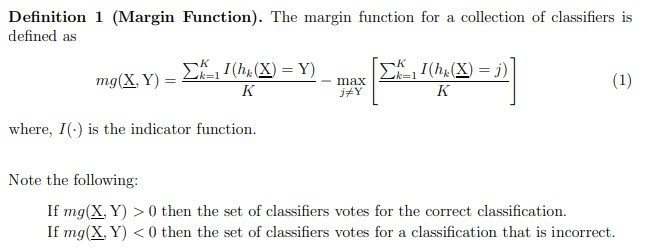

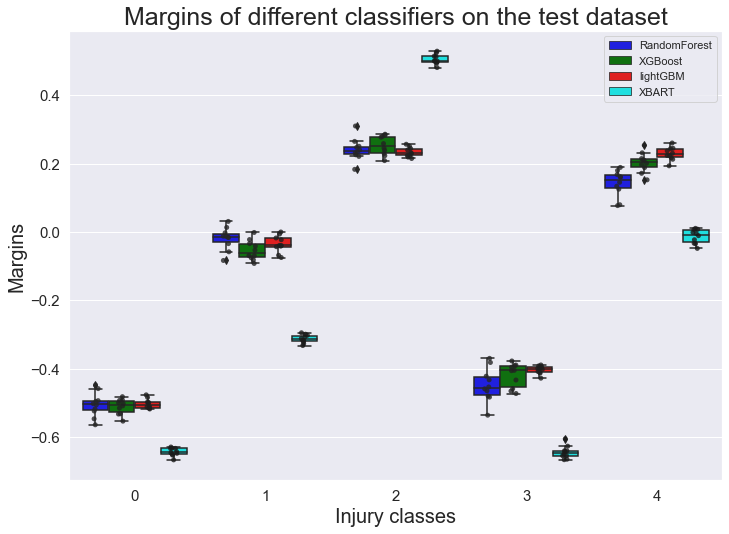

In [338]:
######Plot the margins
df_rfc_margins = pd.DataFrame(rfc_margins).T
df_rfc_margins.columns = ['0','1','2','3','4']
df_rfc_margins.to_csv('all_variables_results3/rfc_margins.csv')
df_xgb_margins = pd.DataFrame(xgb_margins).T
df_xgb_margins.columns = ['0','1','2','3','4']
df_xgb_margins.to_csv('all_variables_results3/xgb_margins.csv')
df_lgb_margins = pd.DataFrame(lgb_margins).T
df_lgb_margins.columns = ['0','1','2','3','4']
df_lgb_margins.to_csv('all_variables_results3/lgb_margins.csv')
df_xbart_margins = pd.DataFrame(xbart_margins).T
df_xbart_margins.columns = ['0','1','2','3','4']
df_xbart_margins.to_csv('all_variables_results3/xbartc_margins.csv')

#melt the data
margins_result = [df_rfc_margins,df_xgb_margins,df_lgb_margins,df_xbart_margins]
df_margins = pd.DataFrame(columns=['Margins','Class','Classifier'])
clf_names = ['RandomForest','XGBoost','lightGBM','XBART']
for mar in range(len(margins_result)):
    for k in ['0','1','2','3','4']:
        df_margins = pd.concat([df_margins,pd.DataFrame({'Margins':margins_result[mar][k],
                                                                  'Class':np.repeat(k,margins_result[mar].shape[0]), 
                                                                  'Classifier':np.repeat(clf_names[mar],margins_result[mar].shape[0])})], axis=0)
    

# plot with seaborn
sns.set(rc={'figure.figsize':(11.7,8.27)})
test_margin_plot = sns.boxplot(y='Margins',x ='Class',data=df_margins,hue='Classifier',palette=['blue', 'green', 'red', 'cyan'])
test_margin_plot = sns.stripplot(y='Margins',x ='Class',
                                   data=df_margins,
                                   hue='Classifier',
                                   jitter=True,
                                   dodge=True, 
                                   marker='o', 
                                   alpha=0.8,
                                   color='k')
test_margin_plot.axes.set_title("Margins of different classifiers on the test dataset",fontsize=25)
test_margin_plot.set_xlabel("Injury classes",fontsize=20)
test_margin_plot.set_ylabel("Margins",fontsize=20)
test_margin_plot.tick_params(labelsize=15)
# get legend information from the plot object
handles, labels = test_margin_plot.get_legend_handles_labels()
# specify just one legend
plt.legend(handles[0:4], labels[0:4])
plt.savefig('all_variables_results3/Margins of different classifiers on test dataset.jpg',dpi=300)

### Marginal effects
<br> Nathan Carroll, oglmx: A Package for Estimation of Ordered Generalized Linear Models, 2018
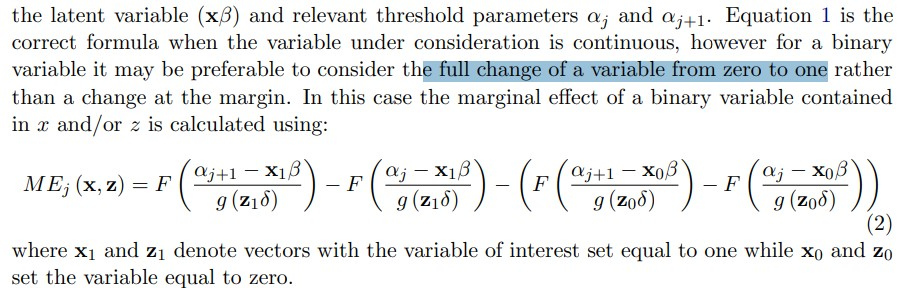

In [343]:
def merge_all(marginal_list):
    
    clf_names = ['RandomForest','XGBoost','lightGBM','XBART']
    
    def marginal_effects_combined(df, classifier):
        df_mar_eff = pd.DataFrame()
        for i in range(10):
            df_single = df[str(i)].reset_index()
            df_mar_eff = pd.concat([df_mar_eff,df_single])
        df_mar_eff['Classifier'] = np.repeat(classifier, df_mar_eff.shape[0])
        # change to percentage
        df_mar_eff.iloc[:,1:-1] = df_mar_eff.iloc[:,1:-1]
        return df_mar_eff
    
    # aggregate all dataframe in a dictionary
    marginals_by_clf = {}
    for i in range(len(marginal_list)):
        marginals_by_clf[clf_names[i]] = marginal_effects_combined(marginal_list[i], clf_names[i])
    # split the data by class
    marginal_effects_dict = {}
    for k in range(5):
        df = pd.DataFrame()
        for key in marginals_by_clf.keys():
            df_clf = marginals_by_clf[key]
            df = pd.concat([df, df_clf[df_clf['index']=='class_'+str(k)]],axis=0,ignore_index=True)
        marginal_effects_dict[str(k)] = df.iloc[:,1:]
    
    return marginal_effects_dict

In [344]:
all_marginals_by_class = merge_all([rfc_marginal_effects,xgb_marginal_effects,lgb_marginal_effects,xbart_marginal_effects])

In [349]:
marginal_effects_class0 = all_marginals_by_class['0']
marginal_effects_class1 = all_marginals_by_class['1']
marginal_effects_class2 = all_marginals_by_class['2']
marginal_effects_class3 = all_marginals_by_class['3']
marginal_effects_class4 = all_marginals_by_class['4']
marginal_effects_class0.to_csv('all_variables_results3/marginal_effects_class0.csv')
marginal_effects_class1.to_csv('all_variables_results3/marginal_effects_class1.csv')
marginal_effects_class2.to_csv('all_variables_results3/marginal_effects_class2.csv')
marginal_effects_class3.to_csv('all_variables_results3/marginal_effects_class3.csv')
marginal_effects_class4.to_csv('all_variables_results3/marginal_effects_class4.csv')

In [383]:
pd.to_numeric(marginal_effects_class4['weather_FOG']).groupby(marginal_effects_class4['Classifier']).mean()

Classifier
RandomForest    0.006499
XBART           0.024394
XGBoost         0.005510
lightGBM        0.004080
Name: weather_FOG, dtype: float64

In [346]:
# split all variables by group and place in a dictionary
human_demograph = ['ped_gender_Female', 'ped_gender_MAle', 'ped_gender_Unknown',
                 'Dr_Age', 'driver_gender_Female', 'driver_gender_MAle', 'driver_gender_Unknown','Ped_age']
human_violation = ['ped_alc', 'ped_drug', 'ped_intoxicated', 'dr_alc', 'dr_drug',
                   'dr_intoxicated', 'ped_dr_intoxicated', 'hit_run']
road_setting = ['Crash_Speed_Limit','intersection', 'At_Intrsct_Fl']
vehicle_type = ['car', 'Bus', 'motorcycle', 'pickup', 'Public', 'SUV', 'truck', 'Van','Others']

vars_dict = {}
vars_dict['human_demograph'] = human_demograph
vars_dict['human_violation'] = human_violation
vars_dict['road_setting'] = road_setting
vars_dict['vehicle_type'] = vehicle_type

for col in data2.columns:
    split_var = marginal_effects_class2.filter(regex=col+'_').columns.tolist()
    vars_dict[col] = split_var

del vars_dict['ped_gender']
del vars_dict['driver_gender']

# adjust the order
vars_dict['time2'] = ['time2_5AM_7AM','time2_7AM_11AM','time2_11AM_4PM','time2_4PM_8PM','time2_8PM_11PM','time2_11PM_5AM']
human_age_gen = ['ped_gender_Female', 'ped_gender_MAle', 'ped_gender_Unknown','Ped_age',
                 'driver_gender_Female', 'driver_gender_MAle', 'driver_gender_Unknown','Dr_Age',]
vars_dict['road_class'] = ['road_class_CITY_STREET', 'road_class_COUNTY_ROAD', 'road_class_FARM_MARKET', 'road_class_INTERSTATE',
                           'road_class_US_STATE', 'road_class_TOLLWAY_TOLL_BRIDGES','road_class_NON_TRAFFICWAY', 'road_class_OTHER_ROADS']
vars_dict['road_place']=['road_place_ON_ROADWAY','road_place_OFF_ROADWAY','road_place_MEDIAN','road_place_SHOULDER', 'road_place_NOT_APPLICABLE']

vars_dict['road_part']=['road_part_MAIN_PROPER_LANE','road_part_CONNECTOR_FLYOVER', 'road_part_ENTRANCE_ON_RAMP',
                         'road_part_EXIT_OFF_RAMP', 'road_part_SERVICE_FRONTAGE_ROAD','road_part_OTHER']
vars_dict['road_alignment'] = ['road_alignment_CURVED', 'road_alignment_STRAIGHT_GRADE', 'road_alignment_STRAIGHT_LEVEL','road_alignment_OTHER']

vars_dict['road_surface']=['road_surface_DRY', 'road_surface_SAND_MUD_DIRT','road_surface_WET',
                             'road_surface_SLUSH', 'road_surface_STANDING_WATER','road_surface_SNOW_ICE', 'road_surface_OTHER']
vars_dict['traffic_control'] = ['traffic_control_HUMAN_CONTROL', 'traffic_control_TRAFFIC_SIGN', 'traffic_control_TRAFFIC_SIGNAL',
                                 'traffic_control_MARKED_LANES', 'traffic_control_OTHER','traffic_control_NONE']
vars_dict['population'] = ['population_RURAL','population_TOWN_2499','population_2500_4999','population_5000_9999','population_10000_24999','population_25000_49999',
                           'population_50000_99999','population_100000_249999','population_250000_OVER']
vars_dict['weather'] = ['weather_CLEAR','weather_CLOUDY','weather_FOG','weather_RAIN','weather_SEVERE_CROSSWINDS',
                        'weather_SNOW','weather_BLOWINGSAND_SNOW','weather_SLEET_HAIL','weather_OTHER']
vars_dict['season'] = ['season_spring', 'season_summer','season_fall', 'season_winter']
vars_dict['light'] = ['light_DAYLIGHT','light_DAWN','light_DUSK','light_DARK_LIGHTED','light_DARK_UNKNOWN_LIGHTING',
                         'light_DARK_NOT_LIGHTED', 'light_OTHER']

<ipython-input-348-6ec3fb37b9f7>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


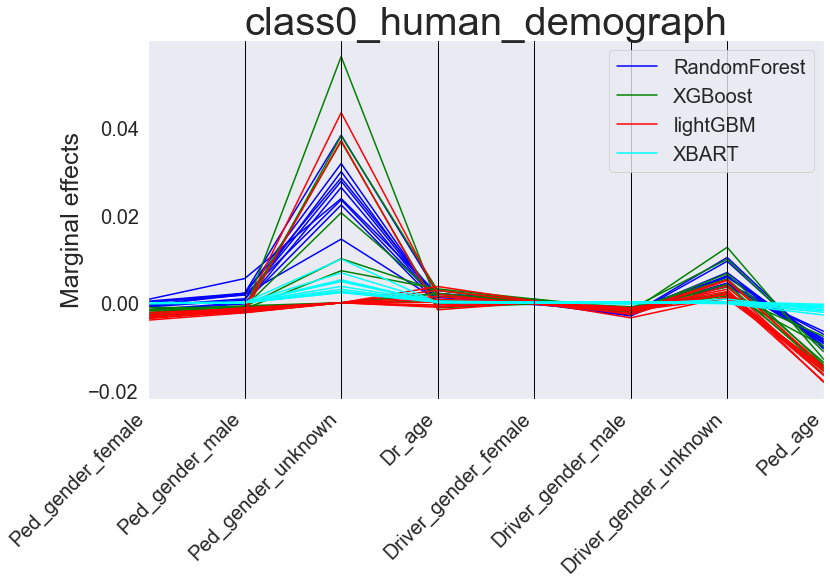

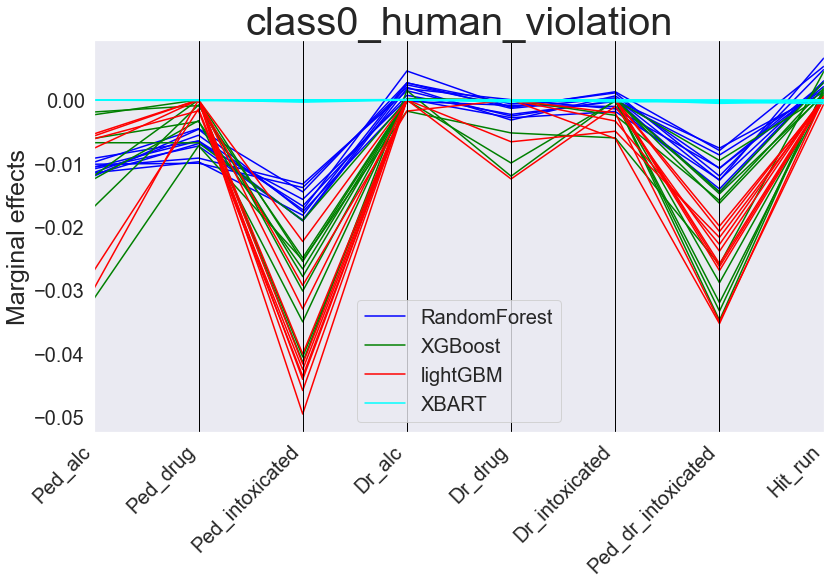

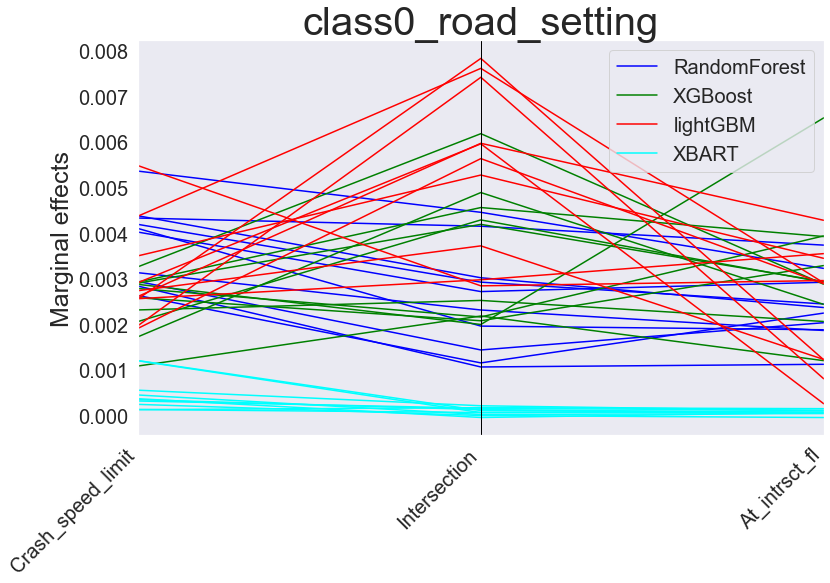

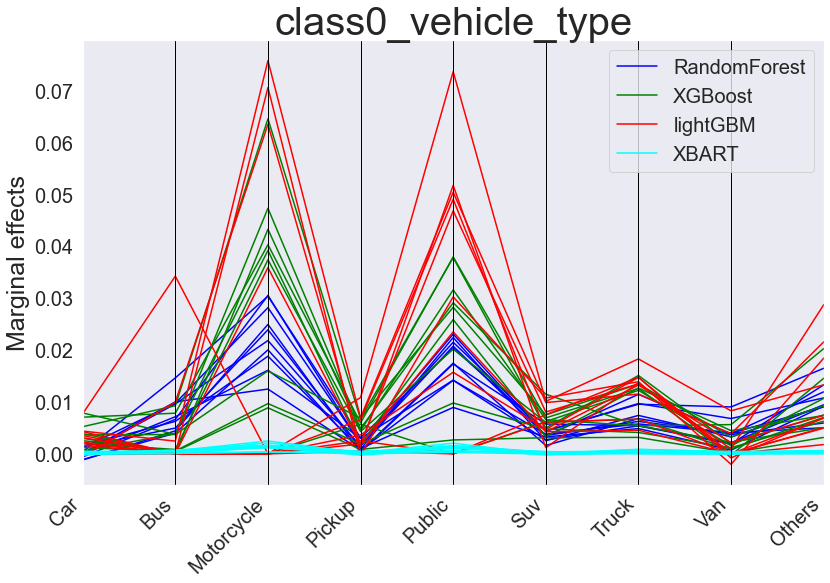

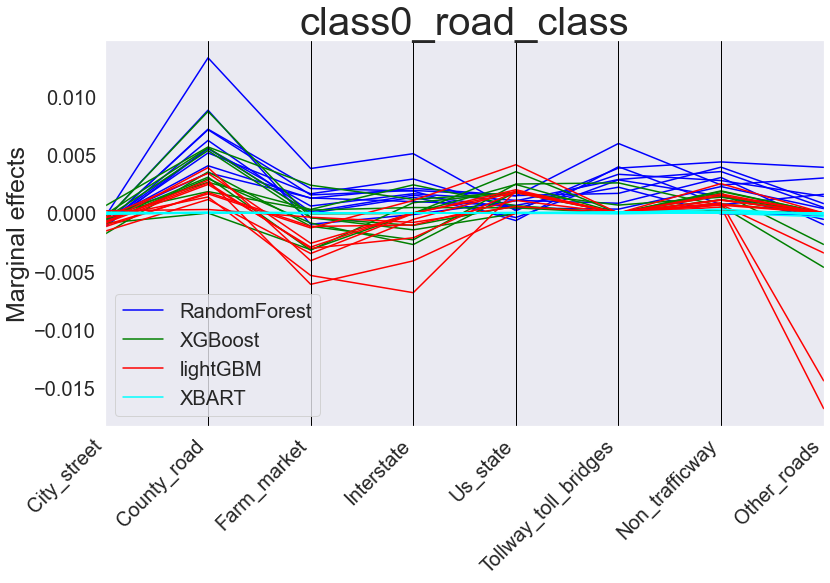

...

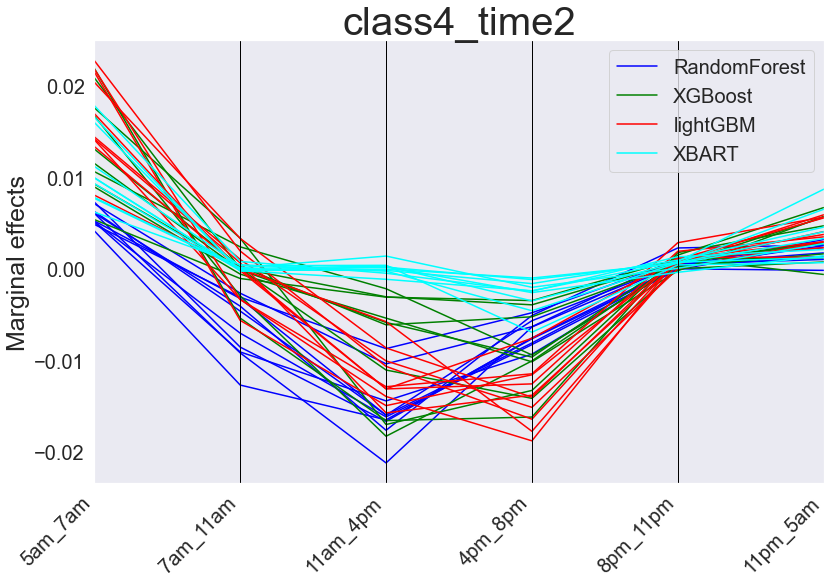

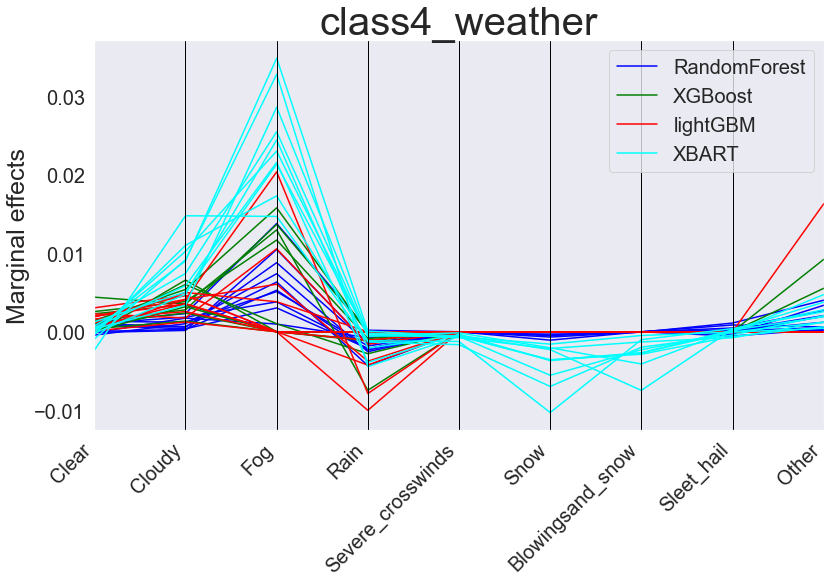

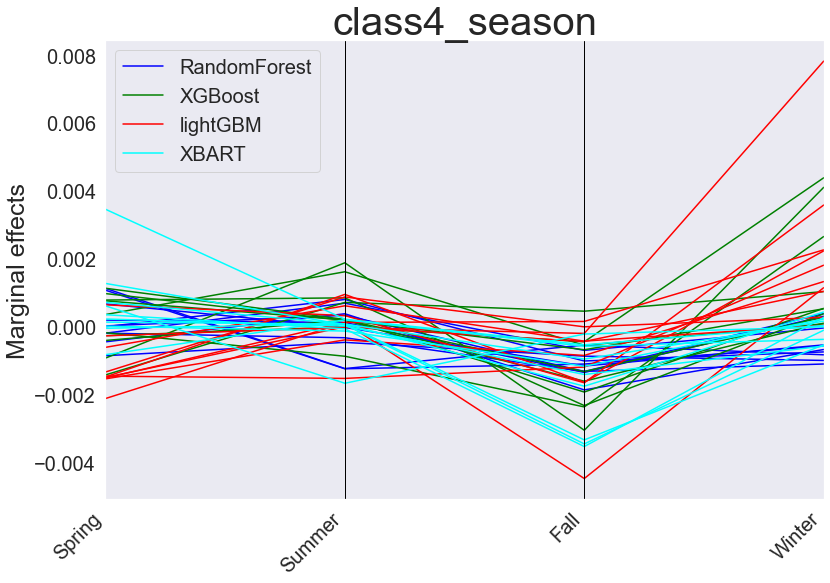

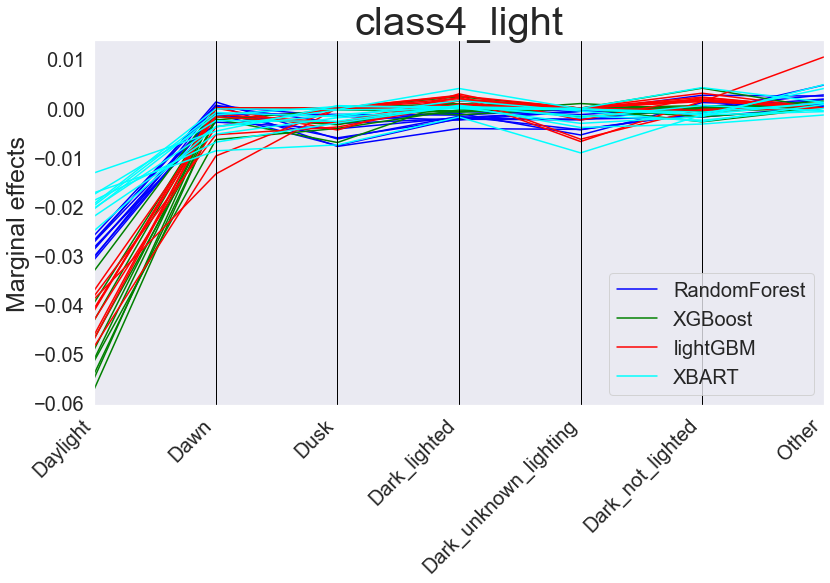

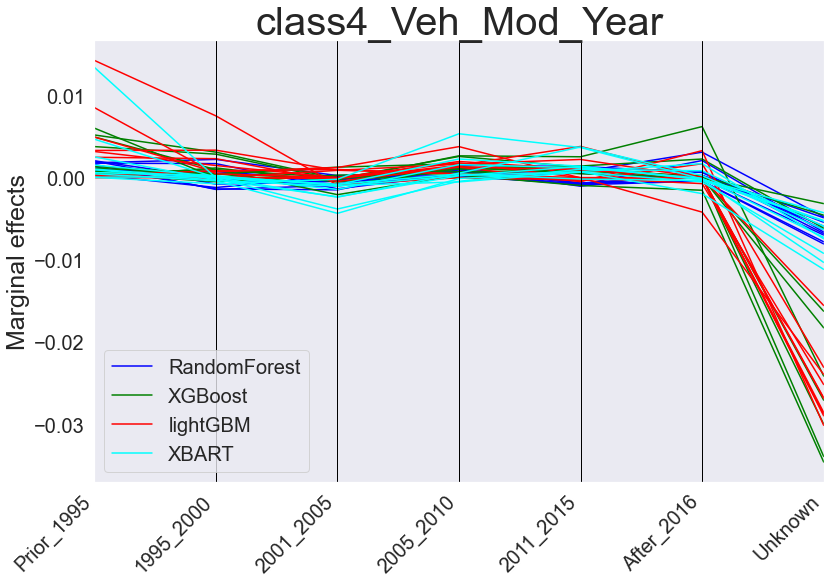

In [348]:
########plot one group by one group
from pandas.plotting import parallel_coordinates
def marginal_effects_one_plot(class_data, title):
    for i,key in enumerate(vars_dict.keys()):
        # extract data
        df = class_data[['Classifier']+vars_dict[key]]
        # plot
        fig, ax = plt.subplots()
        parallel_coordinates(df,'Classifier',color=['blue', 'green', 'red', 'cyan'],ax=ax)
        if key in ['human_demograph','human_violation','road_setting','vehicle_type']:
            xticklabels = df.columns[1:]
            xticklabels = [i.capitalize() for i in xticklabels]
        else:
            xticklabels = [col.split(key+'_')[1] for col in df.columns[1:]]
            xticklabels = [i.capitalize() for i in xticklabels]
        ax.set_xticklabels(xticklabels,rotation=45,ha='right',fontsize=20)
        ax.tick_params(axis="y", labelsize=20)

        ax.set_title(title+'_'+key,fontsize=40)
        ax.set_ylabel('Marginal effects',fontsize=25)
#         ax.legend(prop=dict(size=10))
        plt.legend(loc='best', prop={'size': 20})
#     fig.legend(handles, labels, bbox_to_anchor=(0.6, 0.04))
        plt.tight_layout()
#         plt.show()
        plt.savefig('all_variables_results3/'+title+'/{}.jpg'.format(i),dpi=300)

## plot all marginals
all_marginals = [marginal_effects_class0,marginal_effects_class1,marginal_effects_class2,marginal_effects_class3,marginal_effects_class4]
labels = ['class0','class1','class2','class3','class4']
# marginal_effects_one_plot(marginal_effects_class2,'class2')

for i in range(len(labels)):
    marginal_effects_one_plot(all_marginals[i],labels[i])

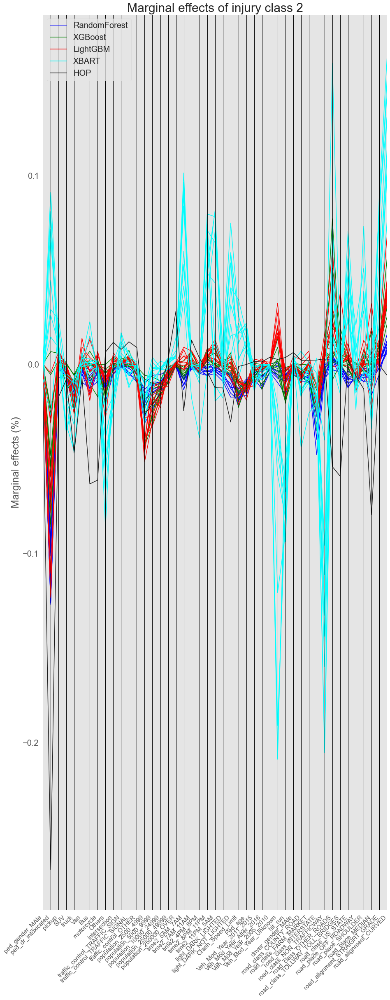

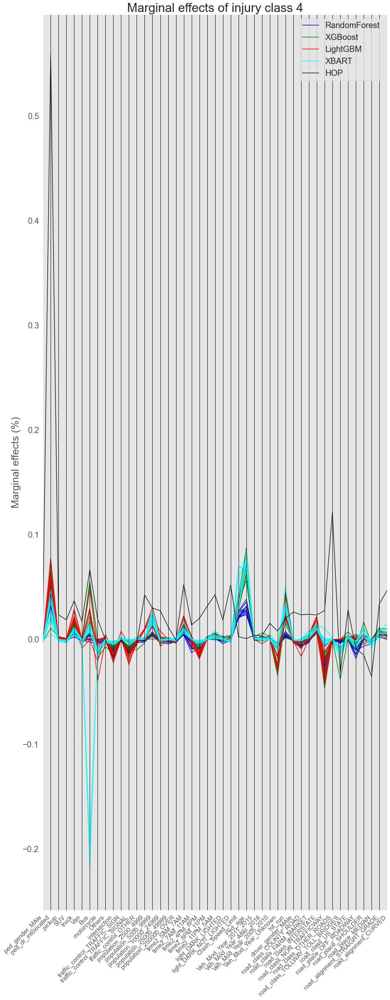

In [350]:
'''Compare with Mashrur's HOP models'''

Mashrur_margins = pd.read_csv('G:/Study/Courses/Data analysis/Course projects/CRIS_project/New_cris/cris_severity/Probit/Marginal_effects_Mashrur.csv',index_col='Unnamed: 0')

vars_renamed = ['ped_gender_MAle','ped_dr_intoxicated','pickup','SUV','truck','Van','Bus','motorcycle',
'Others','intersection','traffic_control_TRAFFIC_SIGN','traffic_control_TRAFFIC_SIGNAL','traffic_control_OTHER',
 'population_2500_4999', 'population_5000_9999', 'population_10000_24999', 'population_25000_49999', 'population_250000_OVER',
'time2_5AM_7AM', 'time2_7AM_11AM', 'time2_4PM_8PM', 'time2_8PM_11PM', 'time2_11PM_5AM','light_DARK_LIGHTED',
 'light_DARK_NOT_LIGHTED', 'Crash_Speed_Limit', 'Ped_age','Veh_Mod_Year_2011_2015', 'Veh_Mod_Year_After_2016',
 'Veh_Mod_Year_2005_2010', 'Veh_Mod_Year_Unknown', 'hit_run','Dr_Age_less_24', 'Dr_Age_old_65', 'driver_gender_MAle',
 'road_class_COUNTY_ROAD', 'road_class_FARM_MARKET', 'road_class_INTERSTATE', 'road_class_NON_TRAFFICWAY', 'road_class_OTHER_ROADS',
 'road_class_TOLLWAY_TOLL_BRIDGES', 'road_class_US_STATE','road_place_OFF_ROADWAY', 'road_place_SHOULDER', 'road_place_MEDIAN', 'road_alignment_STRAIGHT_GRADE',
 'road_alignment_CURVED']

Mashrur_margins.index = vars_renamed
vars_renamed = [i for i in vars_renamed if i not in ['Dr_Age_less_24', 'Dr_Age_old_65']]

'''Quick overview of Marginal effects including HOP from Mashrur's paper'''

from pandas.plotting import parallel_coordinates
plt.style.use('ggplot')

# class 2
d2 = marginal_effects_class2[vars_renamed].append(Mashrur_margins.loc[vars_renamed,'class2'])

d2['Classifier'] = np.repeat('RandomForest',10).tolist()+np.repeat('XGBoost',10).tolist()+np.repeat('LightGBM',10).tolist()+np.repeat('XBART',10).tolist()+['HOP']
fig, ax = plt.subplots(figsize=(15,40))                                          
parallel_coordinates(d2, 'Classifier',color=['blue', 'green', 'red', 'cyan','k'])
ax.set_xticklabels(marginal_effects_class2[vars_renamed].columns,rotation=45,ha='right',fontsize=15)
ax.set_ylabel('Marginal effects (%)',fontsize=25)
ax.tick_params(axis="y", labelsize=20)
plt.title('Marginal effects of injury class 2',fontsize=30)
plt.legend(loc='best', prop={'size': 20})
plt.savefig('all_variables_results3/comparision_with_HOP_class2.jpg',dpi=300)

# class 4
d4 = marginal_effects_class4[vars_renamed].append(Mashrur_margins.loc[vars_renamed,'class4'])


d4['Classifier'] = np.repeat('RandomForest',10).tolist()+np.repeat('XGBoost',10).tolist()+np.repeat('LightGBM',10).tolist()+np.repeat('XBART',10).tolist()+['HOP']
fig, ax = plt.subplots(figsize=(15,40))                                          
parallel_coordinates(d4, 'Classifier',color=['blue', 'green', 'red', 'cyan','k'])
ax.set_xticklabels(marginal_effects_class4[vars_renamed].columns,rotation=45,ha='right',fontsize=15)
ax.set_ylabel('Marginal effects (%)',fontsize=25)
ax.tick_params(axis="y", labelsize=20)
plt.title('Marginal effects of injury class 4',fontsize=30)
plt.legend(loc='best', prop={'size': 20})
plt.savefig('all_variables_results3/comparision_with_HOP_class4.jpg',dpi=300)